<a href="https://colab.research.google.com/github/Shaddynetwork/Capstone/blob/main/Portfolio_forecast_Garch_Arijit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Install yfinance library if not installed
!pip install yfinance


In [ ]:
import yfinance as yf

# List of Yahoo Finance tickers
tickers = [
    "0728.HK", "1211.HK", "0857.HK", "0386.HK", "1171.HK", "0168.HK",
    "0902.HK", "0914.HK", "2600.HK", "0358.HK", "2883.HK", "1055.HK",
    "0921.HK", "1138.HK", "0670.HK", "0576.HK", "0177.HK", "0696.HK",
    "0991.HK", "0317.HK", "0548.HK", "0694.HK", "0995.HK", "0874.HK",
    "0338.HK", "1385.HK", "1072.HK", "0107.HK", "1033.HK",
    "0525.HK", "0038.HK", "0323.HK", "0347.HK", "1133.HK"
]

# Data availability check
def check_ticker_availability(tickers):
    available_tickers = []
    unavailable_tickers = []
    for ticker in tickers:
        try:
            data = yf.Ticker(ticker).history(period="1d")
            if not data.empty:
                available_tickers.append(ticker)
            else:
                unavailable_tickers.append(ticker)
        except Exception as e:
            unavailable_tickers.append(ticker)
    return available_tickers, unavailable_tickers


available, unavailable = check_ticker_availability(tickers)

print("Available Tickers:", available)
print("Unavailable Tickers:", unavailable)


Available Tickers: ['0728.HK', '1211.HK', '0857.HK', '0386.HK', '1171.HK', '0168.HK', '0902.HK', '0914.HK', '2600.HK', '0358.HK', '2883.HK', '1055.HK', '0921.HK', '1138.HK', '0670.HK', '0576.HK', '0177.HK', '0696.HK', '0991.HK', '0317.HK', '0548.HK', '0694.HK', '0995.HK', '0874.HK', '0338.HK', '1385.HK', '1072.HK', '0107.HK', '1033.HK', '0525.HK', '0038.HK', '0323.HK', '0347.HK', '1133.HK']
Unavailable Tickers: []


In [ ]:
# Check the Start date of the data
def check_data_start_date(tickers):
    ticker_start_dates = {}
    for ticker in tickers:
        try:
            # Historical data fetch
            data = yf.Ticker(ticker).history(period="max")
            if not data.empty:

                start_date = data.index.min().date()
                ticker_start_dates[ticker] = start_date
        except Exception as e:
            ticker_start_dates[ticker] = None

    return ticker_start_dates

start_dates = check_data_start_date(tickers)

print("Start dates for each ticker:")
for ticker, start_date in start_dates.items():
    if start_date:
        print(f"{ticker}: Data starts from {start_date}")
    else:
        print(f"{ticker}: No data available")


Start dates for each ticker:
0728.HK: Data starts from 2002-11-15
1211.HK: Data starts from 2002-07-31
0857.HK: Data starts from 2000-04-07
0386.HK: Data starts from 2000-10-19
1171.HK: Data starts from 2000-01-04
0168.HK: Data starts from 2000-01-04
0902.HK: Data starts from 2000-01-04
0914.HK: Data starts from 2000-01-04
2600.HK: Data starts from 2001-12-12
0358.HK: Data starts from 2000-01-04
2883.HK: Data starts from 2002-11-20
1055.HK: Data starts from 2000-01-04
0921.HK: Data starts from 2000-01-04
1138.HK: Data starts from 2000-01-04
0670.HK: Data starts from 2000-01-04
0576.HK: Data starts from 2000-01-04
0177.HK: Data starts from 2000-01-04
0696.HK: Data starts from 2001-02-08
0991.HK: Data starts from 2000-01-04
0317.HK: Data starts from 2000-01-04
0548.HK: Data starts from 2000-01-04
0694.HK: Data starts from 2000-02-01
0995.HK: Data starts from 2000-01-04
0874.HK: Data starts from 2000-01-04
0338.HK: Data starts from 2000-01-04
1385.HK: Data starts from 2000-08-04
1072.HK: 

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

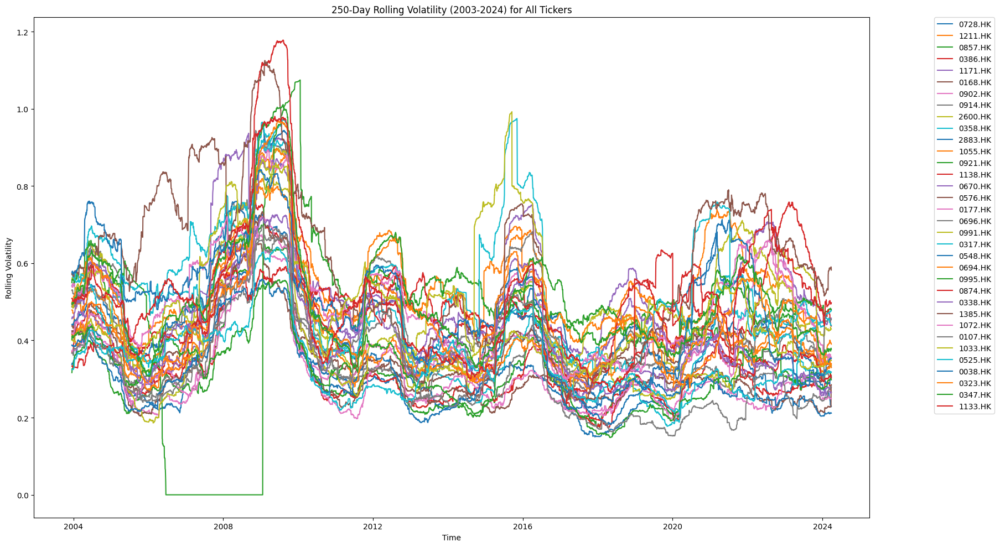

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

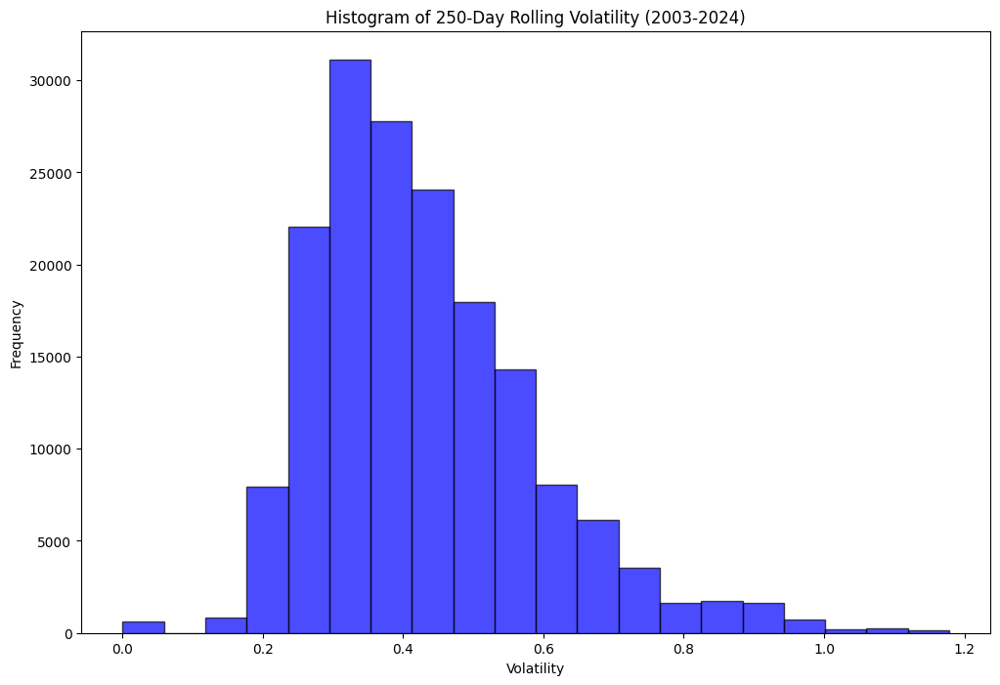

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

start_date = "2003-01-01"
end_date = "2024-03-31"
rolling_window = 250

#Plot for rolling Volatility
plt.figure(figsize=(18, 10))

# Loop through each ticker to calculate rolling volatility and plot
for i, symbol in enumerate(tickers):
    try:
        # Fetch data for the specified period
        data = yf.download(symbol, start=start_date, end=end_date)

        if data.empty:
            raise ValueError(f"No data available for {symbol} from {start_date}")

        # Calculate daily log returns from 'Close' prices
        data['Log_Returns'] = np.log(data['Close'] / data['Close'].shift(1))

        # Calculate 250-day rolling volatility (annualized)
        data['Rolling_Volatility'] = data['Log_Returns'].rolling(window=rolling_window).std() * np.sqrt(250)

        # Drop NaN values
        data = data.dropna()

        # Plot rolling volatility over time
        plt.plot(data.index, data['Rolling_Volatility'], label=symbol)

    except Exception as e:
        print(f"Error with {symbol}: {e}")

# Add labels and title to the plot
plt.title("250-Day Rolling Volatility (2003-2024) for All Tickers")
plt.xlabel("Time")
plt.ylabel("Rolling Volatility")
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1), ncol=1, borderaxespad=0.)
plt.tight_layout()
plt.show()

# Create a histogram to visualize the distribution of rolling volatilities
plt.figure(figsize=(12, 8))
all_volatility = []

# Aggregate rolling volatility data for the histogram
for symbol in tickers:
    try:
        data = yf.download(symbol, start=start_date, end=end_date)

        if not data.empty:
            data['Log_Returns'] = np.log(data['Close'] / data['Close'].shift(1))
            data['Rolling_Volatility'] = data['Log_Returns'].rolling(window=rolling_window).std() * np.sqrt(250)
            all_volatility.extend(data['Rolling_Volatility'].dropna().tolist())

    except Exception as e:
        print(f"Error with {symbol}: {e}")

# Plot the histogram with superimposed rolling volatilities
plt.hist(all_volatility, bins=20, alpha=0.7, edgecolor='black', color='b')
plt.title("Histogram of 250-Day Rolling Volatility (2003-2024)")
plt.xlabel("Volatility")
plt.ylabel("Frequency")
plt.show()


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

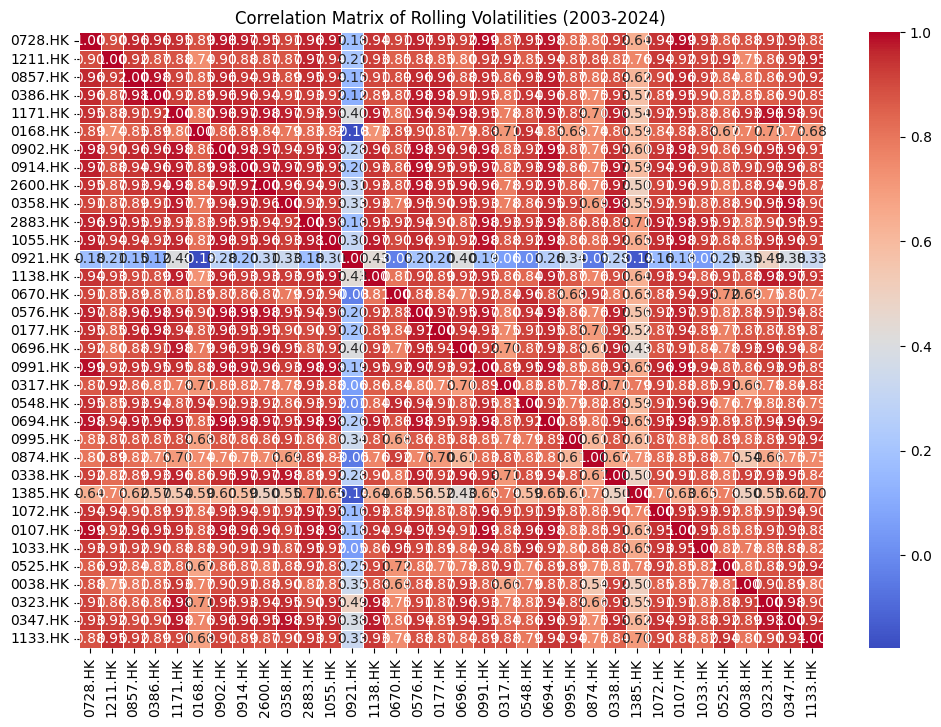

Two equities with diverse volatility profile: [('0921.HK', '0168.HK'), ('1385.HK', '0921.HK')]


In [ ]:

import seaborn as sns
start_date = "2003-01-01"
end_date = "2009-12-31"

# Rolling window for 250-day volatility
rolling_window = 250

# Create a DataFrame to store rolling volatilities for all tickers
volatility_df = pd.DataFrame()

# Fetch data and calculate rolling volatilities for each ticker
for symbol in tickers:
    try:
        # Fetch data for the specified period
        data = yf.download(symbol, start=start_date, end=end_date)

        if data.empty:
            raise ValueError(f"No data available for {symbol} from {start_date}")

        # Calculate daily log returns from 'Close' prices
        data['Log_Returns'] = np.log(data['Close'] / data['Close'].shift(1))

        # Calculate 250-day rolling volatility (annualized)
        data['Rolling_Volatility'] = data['Log_Returns'].rolling(window=rolling_window).std() * np.sqrt(250)

        # Drop NaN values and store rolling volatility in DataFrame
        volatility_df[symbol] = data['Rolling_Volatility'].dropna()

    except Exception as e:
        print(f"Error with {symbol}: {e}")

# Calculate the correlation matrix for the rolling volatilities
correlation_matrix = volatility_df.corr()

# Plot the correlation matrix to identify closely matched tickers
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Rolling Volatilities (2003-2024)")
plt.show()

# Suggest two equities with the most diverse volatility
diverse_tickers = correlation_matrix.unstack().sort_values().drop_duplicates().head(2)
print("Two equities with diverse volatility profile:", diverse_tickers.index.tolist())


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


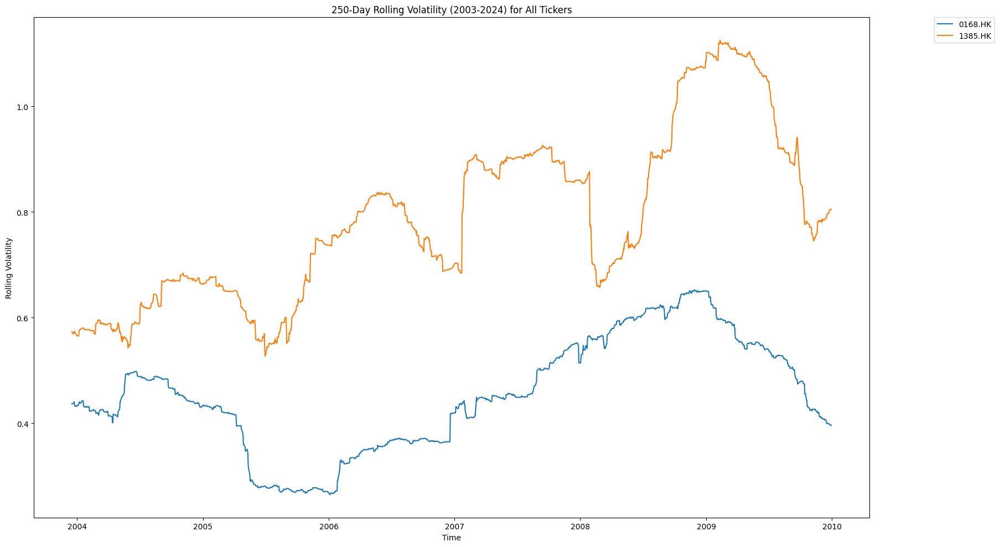

In [ ]:
tickers = ["0168.HK","1385.HK"]

# Date range for data retrieval (1st January 2003 to 31st March 2024)
start_date = "2003-01-01"
end_date = "2009-12-31"

# Rolling window for 250-day volatility
rolling_window = 250

# Create a plot for rolling volatility for each ticker
plt.figure(figsize=(18, 10))

# Loop through each ticker to calculate rolling volatility and plot
for i, symbol in enumerate(tickers):
    try:
        # Fetch data for the specified period
        data = yf.download(symbol, start=start_date, end=end_date)

        if data.empty:
            raise ValueError(f"No data available for {symbol} from {start_date}")

        # Calculate daily log returns from 'Close' prices
        data['Log_Returns'] = np.log(data['Close'] / data['Close'].shift(1))

        # Calculate 250-day rolling volatility (annualized)
        data['Rolling_Volatility'] = data['Log_Returns'].rolling(window=rolling_window).std() * np.sqrt(250)

        # Drop NaN values
        data = data.dropna()

        # Plot rolling volatility over time
        plt.plot(data.index, data['Rolling_Volatility'], label=symbol)

    except Exception as e:
        print(f"Error with {symbol}: {e}")

# Add labels and title to the plot
plt.title("250-Day Rolling Volatility (2003-2024) for All Tickers")
plt.xlabel("Time")
plt.ylabel("Rolling Volatility")
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1), ncol=1, borderaxespad=0.)
plt.tight_layout()
plt.show()


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


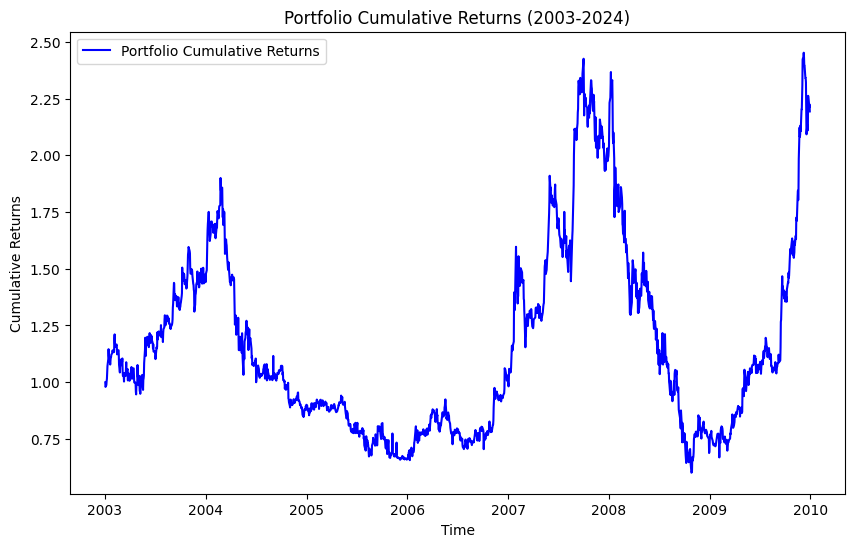

In [ ]:
ticker1 = "0168.HK"
ticker2 = "1385.HK"
# Date range for data retrieval (1st January 2003 to 31st March 2024)
start_date = "2003-01-01"
end_date = "2009-12-31"

# Fetch historical data for both tickers
data1 = yf.download(ticker1, start=start_date, end=end_date)
data2 = yf.download(ticker2, start=start_date, end=end_date)

# Check if data is valid
if data1.empty or data2.empty:
    raise ValueError("Data retrieval error. One or both tickers have no data.")

# Calculate daily log returns for each ticker
data1['Log_Returns'] = np.log(data1['Close'] / data1['Close'].shift(1))
data2['Log_Returns'] = np.log(data2['Close'] / data2['Close'].shift(1))

# Combine the returns data into a single DataFrame
returns_df = pd.DataFrame({
    ticker1: data1['Log_Returns'].dropna(),
    ticker2: data2['Log_Returns'].dropna(),
})

# Set portfolio weights (equal weight in this case)
weights = np.array([0.5, 0.5])

# Calculate portfolio returns
portfolio_returns = returns_df.dot(weights)

# Calculate cumulative returns for the portfolio
cumulative_returns = (1 + portfolio_returns).cumprod()

# Plot the cumulative returns to visualize portfolio performance
plt.figure(figsize=(10, 6))
plt.plot(cumulative_returns.index, cumulative_returns, label='Portfolio Cumulative Returns', color='b')
plt.title("Portfolio Cumulative Returns (2003-2024)")
plt.xlabel("Time")
plt.ylabel("Cumulative Returns")
plt.legend()
plt.show()



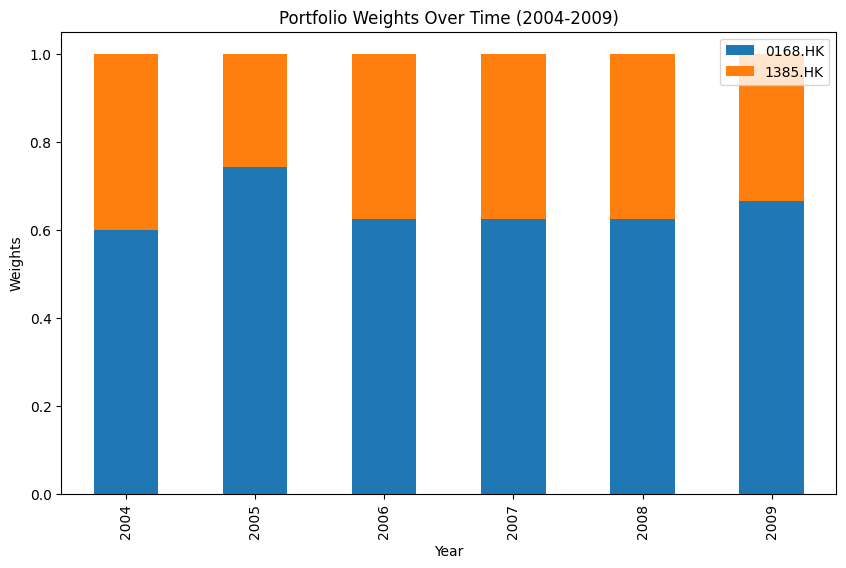

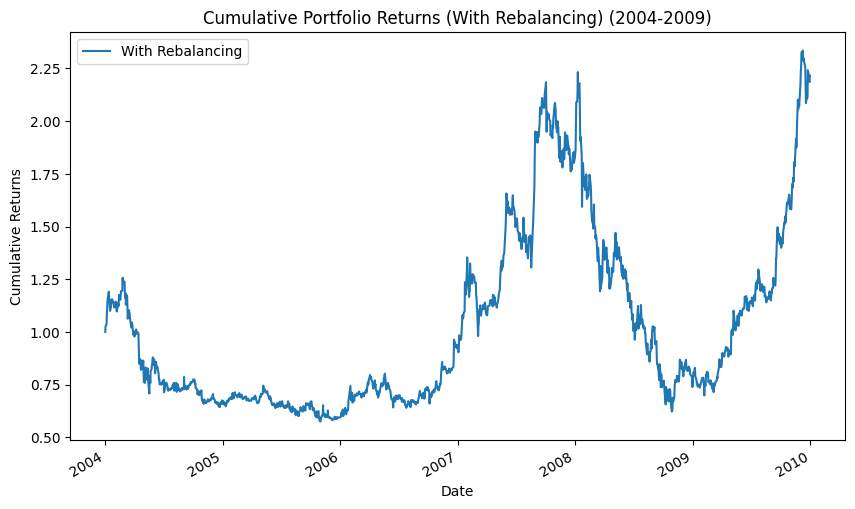

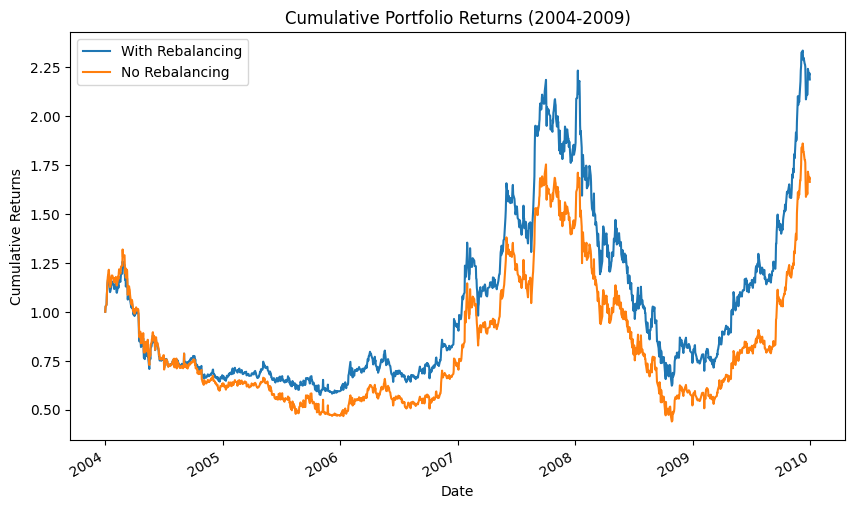

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate annualized volatility
def calculate_annualized_volatility(returns):
    daily_volatility = returns.std()
    annualized_volatility = daily_volatility * np.sqrt(252)  # Assuming 252 trading days per year
    return annualized_volatility

# Download historical price data for the given tickers
tickers = ["0168.HK", "1385.HK"]
start_date = "2003-01-01"
end_date = "2009-12-31"

data = yf.download(tickers, start=start_date, end=end_date, progress=False)

# Consider only 'Adj Close' for adjusted prices
adj_close = data['Adj Close']

# Calculate daily returns
daily_returns = np.log(adj_close / adj_close.shift(1)).dropna()

# Calculate the initial portfolio volatility (December 2003)
portfolio_weights = np.array([0.5, 0.5])  # Equal weights
initial_returns = daily_returns.loc['2003-01-01':'2003-12-31']

# Calculate portfolio returns with equal weights
portfolio_initial = (initial_returns * portfolio_weights).sum(axis=1)
initial_volatility = calculate_annualized_volatility(portfolio_initial)

# Rebalance the portfolio to maintain constant volatility
portfolio_volatility = []
portfolio_returns = []
portfolio_weights_over_time = []

# Loop through each year from 2004 to 2009
for year in range(2004, 2010):
    yearly_returns = daily_returns.loc[f'{year}-01-01':f'{year}-12-31']
    yearly_annualized_volatility = calculate_annualized_volatility(yearly_returns)

    # Calculate the optimal weights to maintain constant volatility
    if yearly_annualized_volatility.sum() == 0:
        new_weights = portfolio_weights  # If no volatility, keep old weights
    else:
        new_weights = (initial_volatility / yearly_annualized_volatility) * (portfolio_weights.sum())

    # Normalize weights to sum to 1
    new_weights = new_weights / new_weights.sum()

    # Store the weights
    portfolio_weights_over_time.append(new_weights)

    # Calculate the portfolio returns for the year
    portfolio_return = (yearly_returns * new_weights).sum(axis=1)
    portfolio_returns.append(portfolio_return)

    # Calculate the portfolio volatility for the year
    portfolio_volatility.append(calculate_annualized_volatility(portfolio_return))

# Concatenate the portfolio returns
portfolio_returns_df = pd.concat(portfolio_returns)

# Plot the weights over time
weights_df = pd.DataFrame(portfolio_weights_over_time, index=range(2004, 2010), columns=tickers)

weights_df.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title("Portfolio Weights Over Time (2004-2009)")
plt.xlabel("Year")
plt.ylabel("Weights")
plt.show()

# Plot the cumulative portfolio returns with rebalancing
cumulative_portfolio_returns = (1 + portfolio_returns_df).cumprod()

cumulative_portfolio_returns.plot(figsize=(10, 6), label='With Rebalancing')
plt.title("Cumulative Portfolio Returns (With Rebalancing) (2004-2009)")
plt.xlabel("Date")
plt.ylabel("Cumulative Returns")
plt.legend()
plt.show()

# Calculate cumulative returns without rebalancing
portfolio_no_rebalance = (daily_returns.loc['2004-01-01':'2009-12-31'] * portfolio_weights).sum(axis=1)
cumulative_no_rebalance = (1 + portfolio_no_rebalance).cumprod()

# Plot both with and without rebalancing
cumulative_portfolio_returns.plot(figsize=(10, 6), label='With Rebalancing')
cumulative_no_rebalance.plot(label='No Rebalancing')
plt.title("Cumulative Portfolio Returns (2004-2009)")
plt.xlabel("Date")
plt.ylabel("Cumulative Returns")
plt.legend()
plt.show()


In [ ]:
!pip install arch
!pip install pandas numpy matplotlib yfinance arch tensorflow keras


In [ ]:
import yfinance as yf
import numpy as np
import pandas as pd
from arch import arch_model

# List of stock tickers
tickers = [
    "0728.HK", "1211.HK", "0857.HK", "0386.HK", "1171.HK", "0168.HK",
    "0902.HK", "0914.HK", "2600.HK", "0358.HK", "2883.HK", "1055.HK",
    "0921.HK", "1138.HK", "0670.HK", "0576.HK", "0177.HK", "0696.HK",
    "0991.HK", "0317.HK", "0548.HK", "0694.HK", "0995.HK", "0874.HK",
    "0338.HK", "1385.HK", "1072.HK", "0107.HK", "1033.HK",
    "0525.HK", "0038.HK", "0323.HK", "0347.HK", "1133.HK"
]

start_date = "2003-01-01"
end_date = "2024-04-01"

# Dictionary to count best models
model_counts = {
    'GARCH(1,1)': 0,
    'EGARCH(1,1)': 0,
    'APARCH(1,1)': 0,
}

# Loop over tickers
for ticker in tickers:
    try:
        # Download stock data
        data = yf.download(ticker, start=start_date, end=end_date, progress=False)
        adj_close = data["Adj Close"]

        # Calculate daily returns and annualize them
        returns = np.log(adj_close / adj_close.shift(1)).dropna() * np.sqrt(252)

        # Fit different GARCH models
        models = {
            'GARCH(1,1)': arch_model(returns, vol='Garch', p=1, q=1),
            'EGARCH(1,1)': arch_model(returns, vol='EGarch', p=1, q=1),
            'APARCH(1,1)': arch_model(returns, vol='APARCH', p=1, q=1),
        }

        # Fit models and store results
        results = {}
        for name, model in models.items():
            fit = model.fit(disp='off')
            results[name] = {
                'fit': fit,
                'AIC': fit.aic,
                'BIC': fit.bic,
            }

        # Determine the best model by AIC
        best_model = min(results, key=lambda x: results[x]['AIC'])
        model_counts[best_model] += 1

    except Exception as e:
        # Handle errors (e.g., insufficient data)
        print(f"Error processing {ticker}: {e}")

# Display the count of best models
print("Best Model Counts:")
for model, count in model_counts.items():
    print(f"{model}: {count}")


Best Model Counts:
GARCH(1,1): 13
EGARCH(1,1): 2
APARCH(1,1): 19


Iteration:      1,   Func. Count:      7,   Neg. LLF: 39181.50603355237
Iteration:      2,   Func. Count:     18,   Neg. LLF: 35093.48241859721
Iteration:      3,   Func. Count:     29,   Neg. LLF: 5058.752529290181
Iteration:      4,   Func. Count:     38,   Neg. LLF: 4469.548826403263
Iteration:      5,   Func. Count:     45,   Neg. LLF: 4702.195736669046
Iteration:      6,   Func. Count:     52,   Neg. LLF: 4416.30599961073
Iteration:      7,   Func. Count:     58,   Neg. LLF: 4420.638453803804
Iteration:      8,   Func. Count:     65,   Neg. LLF: 4416.062416541992
Iteration:      9,   Func. Count:     71,   Neg. LLF: 4416.013128662696
Iteration:     10,   Func. Count:     77,   Neg. LLF: 4416.013092199493
Iteration:     11,   Func. Count:     82,   Neg. LLF: 4416.013092199217
Optimization terminated successfully    (Exit mode 0)
            Current function value: 4416.013092199493
            Iterations: 11
            Function evaluations: 82
            Gradient evaluations: 11


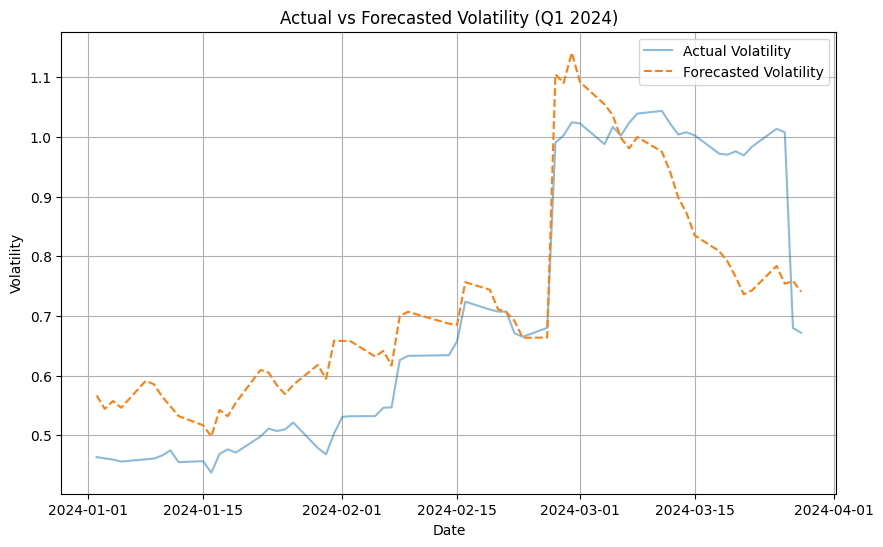

Actual vs Forecasted Volatility (Q1 2024):
            Actual Volatility  Forecasted Volatility
Date                                                
2024-01-02           0.463473               0.566810
2024-01-03           0.461363               0.544245
2024-01-04           0.459339               0.557457
2024-01-05           0.456072               0.546258
2024-01-08           0.459777               0.591376
...                       ...                    ...
2024-03-22           0.983851               0.742939
2024-03-25           1.013692               0.783924
2024-03-26           1.007949               0.754045
2024-03-27           0.679652               0.758489
2024-03-28           0.671919               0.740853

[61 rows x 2 columns]


In [ ]:
import numpy as np
import pandas as pd
import yfinance as yf
from arch import arch_model
import matplotlib.pyplot as plt

# Download historical price data for the given ticker
ticker = "1385.HK"
start_date = "2003-01-01"
end_date = "2024-04-01"

data = yf.download(ticker, start=start_date, end=end_date, progress=False)
adj_close = data["Adj Close"]

# Calculate daily returns and annualize them
returns = np.log(adj_close / adj_close.shift(1)).dropna() * np.sqrt(252)

# Ensure returns is a 1-dimensional Series for GARCH model
if isinstance(returns, pd.DataFrame):
    returns = returns.iloc[:, 0]  # Take the first column if DataFrame
elif isinstance(returns, pd.Series):
    returns = returns.squeeze()  # Ensure it's 1-dimensional

# Fit GARCH(1, 1) model to estimate forecasted volatility
model = arch_model(returns, vol="APARCH", p=1, q=1)
results = model.fit()

# Forecast volatility for 13 weeks ahead starting from "2024-01-01"
forecast = results.forecast(start="2024-01-01", horizon=13, method="simulation")
forecast_volatility = forecast.variance.dropna().mean(axis=1) ** 0.5

# Calculate actual volatility using a rolling standard deviation
# (e.g., 21-day rolling window to represent a monthly estimate)
window_size = 21
actual_volatility = returns.rolling(window_size).std()  # Rolling standard deviation

# Extract actual and forecasted volatilities for Q1 2024
forecast_volatility_q1 = forecast_volatility.loc["2024-01-01":"2024-04-01"]
actual_volatility_q1 = actual_volatility.loc["2024-01-01":"2024-04-01"]

# Create a DataFrame to store the data
volatility_table = pd.DataFrame({
    "Date": forecast_volatility_q1.index,
    "Actual Volatility": actual_volatility_q1.values,
    "Forecasted Volatility": forecast_volatility_q1.values,
})

# Set 'Date' as the index
volatility_table.set_index("Date", inplace=True)

# Plot actual vs forecasted volatility
plt.figure(figsize=(10, 6))
plt.plot(volatility_table.index, volatility_table["Actual Volatility"], label="Actual Volatility", alpha=0.5)
plt.plot(volatility_table.index, volatility_table["Forecasted Volatility"], label="Forecasted Volatility", linestyle="--")
plt.xlabel("Date")
plt.ylabel("Volatility")
plt.title("Actual vs Forecasted Volatility (Q1 2024)")
plt.legend()
plt.grid(True)
plt.show()

# Display the table with actual and forecasted volatilities for Q1 2024
print("Actual vs Forecasted Volatility (Q1 2024):")
print(volatility_table)

# Save the DataFrame to a CSV file
volatility_table.to_csv("actual_vs_forecasted_volatility_q1_2024_1385HK.csv", index=True)  # Index will include dates


Iteration:      1,   Func. Count:      7,   Neg. LLF: 30378.33284739245
Iteration:      2,   Func. Count:     18,   Neg. LLF: 31006.440442904997
Iteration:      3,   Func. Count:     29,   Neg. LLF: 2662.6753957364317
Iteration:      4,   Func. Count:     38,   Neg. LLF: 2191.6487412827964
Iteration:      5,   Func. Count:     45,   Neg. LLF: 2583.082291214403
Iteration:      6,   Func. Count:     52,   Neg. LLF: 2182.0038491918526
Iteration:      7,   Func. Count:     59,   Neg. LLF: 2365.567575133709
Iteration:      8,   Func. Count:     66,   Neg. LLF: 2123.822098596438
Iteration:      9,   Func. Count:     73,   Neg. LLF: 2502.661745593655
Iteration:     10,   Func. Count:     80,   Neg. LLF: 2113.0128573453867
Iteration:     11,   Func. Count:     87,   Neg. LLF: 2112.585266241094
Iteration:     12,   Func. Count:     93,   Neg. LLF: 2112.575770762182
Iteration:     13,   Func. Count:     99,   Neg. LLF: 2112.5657929943754
Iteration:     14,   Func. Count:    105,   Neg. LLF: 2112

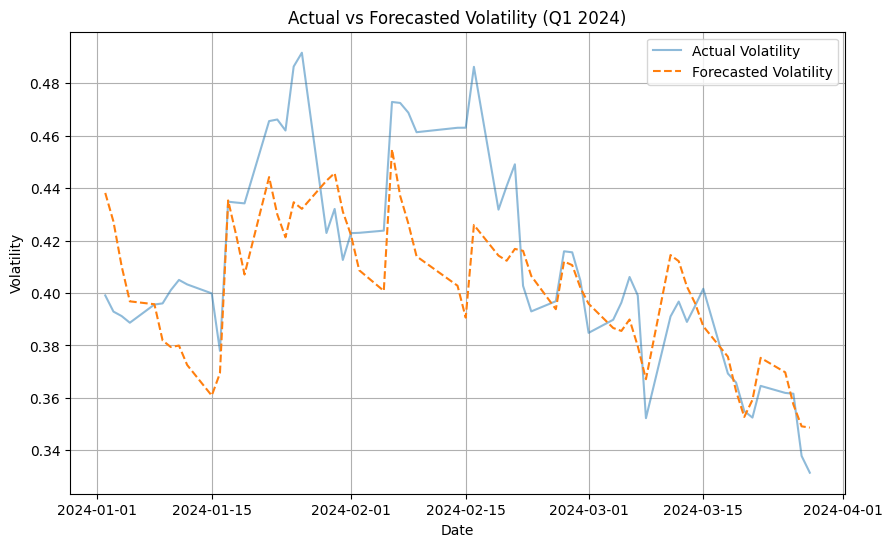

Actual vs Forecasted Volatility (Q1 2024):
            Actual Volatility  Forecasted Volatility
Date                                                
2024-01-02           0.399081               0.438159
2024-01-03           0.392913               0.427241
2024-01-04           0.391208               0.410224
2024-01-05           0.388667               0.396820
2024-01-08           0.395606               0.395719
...                       ...                    ...
2024-03-22           0.364586               0.375277
2024-03-25           0.361903               0.369760
2024-03-26           0.361595               0.357443
2024-03-27           0.337871               0.349162
2024-03-28           0.331470               0.348671

[61 rows x 2 columns]


In [ ]:
import numpy as np
import pandas as pd
import yfinance as yf
from arch import arch_model
import matplotlib.pyplot as plt

# Download historical price data for the given ticker
ticker = "0168.HK"
start_date = "2003-01-01"
end_date = "2024-04-01"

data = yf.download(ticker, start=start_date, end=end_date, progress=False)
adj_close = data["Adj Close"]

# Calculate daily returns and annualize them
returns = np.log(adj_close / adj_close.shift(1)).dropna() * np.sqrt(252)

# Ensure returns is a 1-dimensional Series for GARCH model
if isinstance(returns, pd.DataFrame):
    returns = returns.iloc[:, 0]  # Take the first column if DataFrame
elif isinstance(returns, pd.Series):
    returns = returns.squeeze()  # Ensure it's 1-dimensional

# Fit GARCH(1, 1) model to estimate forecasted volatility
model = arch_model(returns, vol="APARCH", p=1, q=1)
results = model.fit()

# Forecast volatility for 13 weeks ahead starting from "2024-01-01"
forecast = results.forecast(start="2024-01-01", horizon=13, method = "simulation")
forecast_volatility = forecast.variance.dropna().mean(axis=1) ** 0.5

# Calculate actual volatility using a rolling standard deviation
# (e.g., 21-day rolling window to represent a monthly estimate)
window_size = 21
actual_volatility = returns.rolling(window_size).std()  # Rolling standard deviation

# Extract actual and forecasted volatilities for Q1 2024
forecast_volatility_q1 = forecast_volatility.loc["2024-01-01":"2024-04-01"]
actual_volatility_q1 = actual_volatility.loc["2024-01-01":"2024-04-01"]

# Create a DataFrame to store the data
volatility_table = pd.DataFrame({
    "Date": forecast_volatility_q1.index,
    "Actual Volatility": actual_volatility_q1.values,
    "Forecasted Volatility": forecast_volatility_q1.values,
})

# Set 'Date' as the index
volatility_table.set_index("Date", inplace=True)

# Plot actual vs forecasted volatility
plt.figure(figsize=(10, 6))
plt.plot(volatility_table.index, volatility_table["Actual Volatility"], label="Actual Volatility", alpha=0.5)
plt.plot(volatility_table.index, volatility_table["Forecasted Volatility"], label="Forecasted Volatility", linestyle="--")
plt.xlabel("Date")
plt.ylabel("Volatility")
plt.title("Actual vs Forecasted Volatility (Q1 2024)")
plt.legend()
plt.grid(True)
plt.show()

# Display the table with actual and forecasted volatilities for Q1 2024
print("Actual vs Forecasted Volatility (Q1 2024):")
print(volatility_table)
# Save the DataFrame to a CSV file
volatility_table.to_csv("actual_vs_forecasted_volatility_q1_2024_0168HK.csv", index=True)  # Index will include dates


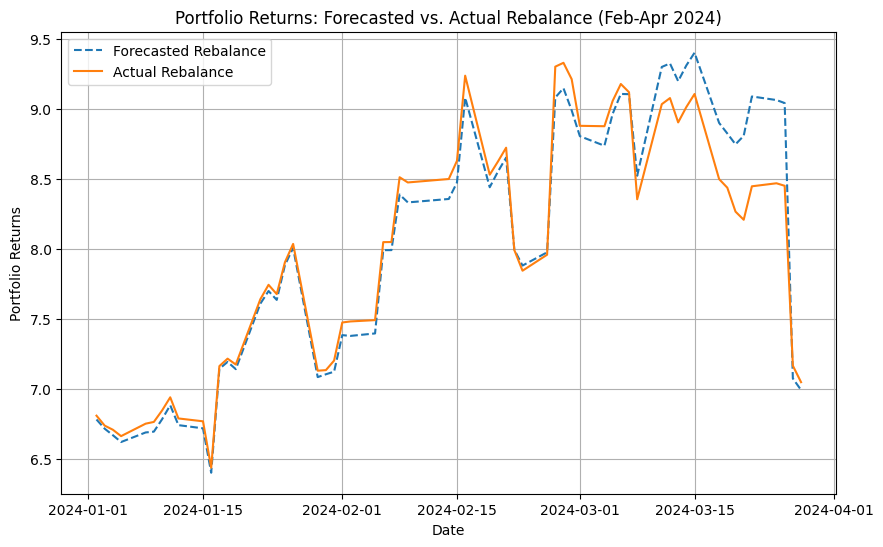

Forecasted Portfolio Weights:
{'0168.HK': Date
2024-01-02    0.564007
2024-01-03    0.560219
2024-01-04    0.576075
2024-01-05    0.579229
2024-01-08    0.599108
                ...   
2024-03-22    0.664396
2024-03-25    0.679496
2024-03-26    0.678411
2024-03-27    0.684772
2024-03-28    0.679978
Name: Forecasted Volatility, Length: 61, dtype: float64, '1385.HK': Date
2024-01-02    0.435993
2024-01-03    0.439781
2024-01-04    0.423925
2024-01-05    0.420771
2024-01-08    0.400892
                ...   
2024-03-22    0.335604
2024-03-25    0.320504
2024-03-26    0.321589
2024-03-27    0.315228
2024-03-28    0.320022
Name: Forecasted Volatility, Length: 61, dtype: float64}

Actual Portfolio Weights:
{'0168.HK': Date
2024-01-02    0.537326
2024-01-03    0.540063
2024-01-04    0.540051
2024-01-05    0.539897
2024-01-08    0.537510
                ...   
2024-03-22    0.729623
2024-03-25    0.736912
2024-03-26    0.735974
2024-03-27    0.667947
2024-03-28    0.669650
Name: Actual Volatil

In [ ]:
# Read the CSV files containing actual and forecasted volatility for the two tickers
volatility_0168HK = pd.read_csv("actual_vs_forecasted_volatility_q1_2024_0168HK.csv", index_col='Date', parse_dates=True)
volatility_1385HK = pd.read_csv("actual_vs_forecasted_volatility_q1_2024_1385HK.csv", index_col='Date', parse_dates=True)

# Calculate portfolio volatility for January 2024 with equal weights
# Equal weights for two assets (0.5 each)
portfolio_volatility_jan = np.sqrt(
    (volatility_0168HK.loc["2024-01-01":"2024-01-31"]["Actual Volatility"] ** 2 * 0.5) +
    (volatility_1385HK.loc["2024-01-01":"2024-01-31"]["Actual Volatility"] ** 2 * 0.5)
).mean()

# Rebalance portfolio to maintain the volatility observed in January 2024
# Using forecasted volatility
forecasted_weights = {
    "0168.HK": portfolio_volatility_jan / volatility_0168HK["Forecasted Volatility"],
    "1385.HK": portfolio_volatility_jan / volatility_1385HK["Forecasted Volatility"],
}

# Normalize forecasted weights to ensure they sum to 100%
total_forecasted_weight = sum(forecasted_weights.values())
forecasted_weights = {k: v / total_forecasted_weight for k, v in forecasted_weights.items()}

# Rebalance portfolio using actual volatility
actual_weights = {
    "0168.HK": portfolio_volatility_jan / volatility_0168HK["Actual Volatility"],
    "1385.HK": portfolio_volatility_jan / volatility_1385HK["Actual Volatility"],
}

# Normalize actual weights to ensure they sum to 100%
total_actual_weight = sum(actual_weights.values())
actual_weights = {k: v / total_actual_weight for k, v in actual_weights.items()}

# Calculate the overall portfolio returns using forecasted and actual weights
# Simulate the portfolio returns
returns_0168HK = volatility_0168HK["Actual Volatility"] * np.sqrt(252)  # Example return estimation
returns_1385HK = volatility_1385HK["Actual Volatility"] * np.sqrt(252)

# Calculate portfolio returns with forecasted rebalance
portfolio_returns_forecasted = (
    returns_0168HK * forecasted_weights["0168.HK"] +
    returns_1385HK * forecasted_weights["1385.HK"]
)

# Calculate portfolio returns with actual rebalance
portfolio_returns_actual = (
    returns_0168HK * actual_weights["0168.HK"] +
    returns_1385HK * actual_weights["1385.HK"]
)

# Plot the portfolio returns for the three-month period
plt.figure(figsize=(10, 6))
plt.plot(portfolio_returns_forecasted.index, portfolio_returns_forecasted, label="Forecasted Rebalance", linestyle="--")
plt.plot(portfolio_returns_actual.index, portfolio_returns_actual, label="Actual Rebalance", linestyle="-")
plt.xlabel("Date")
plt.ylabel("Portfolio Returns")
plt.title("Portfolio Returns: Forecasted vs. Actual Rebalance (Feb-Apr 2024)")
plt.legend()
plt.grid(True)
plt.show()

# Display the calculated weights and portfolio returns
print("Forecasted Portfolio Weights:")
print(forecasted_weights)

print("\nActual Portfolio Weights:")
print(actual_weights)

print("\nPortfolio Returns with Forecasted Rebalance:")
print(portfolio_returns_forecasted)

print("\nPortfolio Returns with Actual Rebalance:")
print(portfolio_returns_actual)


In [ ]:


# Define a function to calculate forecasted and actual rebalancing returns
def calculate_returns(tickers, start_date="2003-01-01", end_date="2024-04-01"):
    results = []

    # Loop through all the tickers in pairs
    for i in range(0, len(tickers), 2):
        # Ensure we have pairs of tickers
        if i + 1 < len(tickers):
            ticker1 = tickers[i]
            ticker2 = tickers[i + 1]

            # Download historical data for both tickers
            data1 = yf.download(ticker1, start=start_date, end=end_date, progress=False)
            data2 = yf.download(ticker2, start=start_date, end=end_date, progress=False)
            adj_close1 = data1["Adj Close"]
            adj_close2 = data2["Adj Close"]

            # Calculate daily returns and annualize them
            returns1 = np.log(adj_close1 / adj_close1.shift(1)).dropna() * np.sqrt(252)
            returns2 = np.log(adj_close2 / adj_close2.shift(1)).dropna() * np.sqrt(252)

            # Calculate daily returns and annualize them
            #returns1 = np.log(data1["Adj_close"] / data1["Adj_close"].shift(1)).dropna() * np.sqrt(252)
            #returns2 = np.log(data2["Adj_close"] / data2["Adj_close"].shift(1)).dropna() * np.sqrt(252)

            # Fit GARCH(1, 1) model to estimate forecasted volatility
            model1 = arch_model(returns1, vol="APARCH", p=1, q=1)
            model2 = arch_model(returns2, vol="APARCH", p=1, q=1)
            results1 = model1.fit()
            results2 = model2.fit()

            # Forecast volatility for 13 weeks ahead starting from 2024-01-01
            forecast1 = results1.forecast(start="2024-01-01", horizon=13, method="simulation")
            forecast2 = results2.forecast(start="2024-01-01", horizon=13, method="simulation")

            forecast_volatility1 = forecast1.variance.dropna().mean(axis=1) ** 0.5
            forecast_volatility2 = forecast2.variance.dropna().mean(axis=1) ** 0.5

            # Calculate actual volatility using a 21-day rolling standard deviation
            actual_volatility1 = returns1.rolling(21).std()  # 21-day rolling window
            actual_volatility2 = returns2.rolling(21).std()  # 21-day rolling window

            # Calculate portfolio volatility for January 2024 with equal weights
            # Equal weights for two assets (0.5 each)
            portfolio_volatility_jan = np.sqrt(
                (actual_volatility1.loc["2024-01-01":"2024-01-31"] ** 2 * 0.5).mean() +
                (actual_volatility2.loc["2024-01-01":"2024-01-31"] ** 2 * 0.5).mean()
            )

            # Rebalance portfolio to maintain the January 2024 portfolio volatility
            forecasted_weights = {
                ticker1: portfolio_volatility_jan / forecast_volatility1,
                ticker2: portfolio_volatility_jan / forecast_volatility2,
            }

            # Normalize forecasted weights
            total_forecasted_weight = sum(forecasted_weights.values())
            forecasted_weights = {k: v / total_forecasted_weight for k, v in forecasted_weights.items()}

            # Calculate portfolio returns using forecasted weights
            forecasted_returns = (
                returns1 * forecasted_weights[ticker1] +
                returns2 * forecasted_weights[ticker2]
            )

            # Portfolio returns with no rebalancing
            equal_weights = {"0.5", "0.5"}
            unbalanced_returns = (
                returns1 * 0.5 + returns2 * 0.5
            )

            # Record the final returns for this pair of stocks
            results.append({
                "Pair": f"{ticker1}, {ticker2}",
                "Forecasted Rebalancing Returns": forecasted_returns.mean(),
                "No Rebalancing Returns": unbalanced_returns.mean(),
            })

    # Create a DataFrame to summarize the results
    return pd.DataFrame(results)


# List of stock tickers for rebalancing analysis
tickers = [
    "0728.HK", "1211.HK", "0857.HK", "0386.HK", "1171.HK", "0168.HK",
    "0902.HK", "0914.HK", "2600.HK", "0358.HK", "2883.HK", "1055.HK",
    "0921.HK", "1138.HK", "0670.HK", "0576.HK", "0177.HK", "0696.HK",
    "0991.HK", "0317.HK", "0548.HK", "0694.HK", "0995.HK", "0874.HK",
    "0338.HK", "1385.HK", "1072.HK", "0107.HK", "1033.HK",
    "0525.HK", "0038.HK", "0323.HK", "0347.HK", "1133.HK"
]

# Calculate the returns for the given pairs of tickers
return_comparison_table = calculate_returns(tickers)

print("Return Comparison: Forecasted Rebalancing vs Actual Rebalancing")
print(return_comparison_table)


Iteration:      1,   Func. Count:      7,   Neg. LLF: 15645.636583751166
Iteration:      2,   Func. Count:     19,   Neg. LLF: 21692.12646547913
Iteration:      3,   Func. Count:     29,   Neg. LLF: 1761.4342305304872
Iteration:      4,   Func. Count:     38,   Neg. LLF: 1111.9612814200468
Iteration:      5,   Func. Count:     45,   Neg. LLF: 11388.513972190092
Iteration:      6,   Func. Count:     52,   Neg. LLF: 1070.864586048879
Iteration:      7,   Func. Count:     59,   Neg. LLF: 1139.4850107762059
Iteration:      8,   Func. Count:     66,   Neg. LLF: 1070.7901796486985
Iteration:      9,   Func. Count:     73,   Neg. LLF: 1070.2115864972986
Iteration:     10,   Func. Count:     79,   Neg. LLF: 1070.2055947334793
Iteration:     11,   Func. Count:     85,   Neg. LLF: 1070.2052406431928
Iteration:     12,   Func. Count:     91,   Neg. LLF: 1070.2052045138437
Iteration:     13,   Func. Count:     97,   Neg. LLF: 1070.20520385338
Optimization terminated successfully    (Exit mode 0)
 

## LSTM MODEL

In [ ]:
# importing the necessary libraries
import yfinance as yf
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense
from math import sqrt
import matplotlib.pyplot as plt

In [ ]:
#importing the data

tickers = ["0168.HK", "1385.HK"]
start_date = "2003-01-01"
end_date = "2024-03-28"

# Fetch historical data for the tickers
data = yf.download(tickers, start=start_date, end=end_date)

# Prepare a clean DataFrame to avoid SettingWithCopyWarning
clean_data = pd.DataFrame(index=data.index)

[*********************100%%**********************]  2 of 2 completed


In [ ]:
# preprocessing the data

rolling_window = 250
for ticker in tickers:
    close_prices = data['Close'][ticker].dropna()
    log_returns = np.log(close_prices / close_prices.shift(1))
    volatility = log_returns.rolling(window=rolling_window).std() * sqrt(rolling_window)
    clean_data[f'Volatility_{ticker}'] = volatility

# Drop rows with NaN values that were introduced by rolling calculation
clean_data.dropna(inplace=True)

# Normalize the rolling volatility data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_volatility_data = {}
for ticker in tickers:
    scaled_volatility_data[ticker] = scaler.fit_transform(clean_data[f'Volatility_{ticker}'].values.reshape(-1, 1))

In [ ]:
#preparing the data for the model

train_end = "2022-12-31"
test_start = "2023-01-01"
test_end = "2023-12-31"
predict_start = "2024-01-01"
predict_end = "2024-03-28"

# Split the data using the aligned indices
train_data = {ticker: scaled_volatility_data[ticker][clean_data.index <= train_end] for ticker in tickers}
test_data = {ticker: scaled_volatility_data[ticker][(clean_data.index >= test_start) & (clean_data.index <= test_end)] for ticker in tickers}
predict_data = {ticker: scaled_volatility_data[ticker][(clean_data.index >= predict_start) & (clean_data.index <= predict_end)] for ticker in tickers}


In [ ]:
from tensorflow.keras.callbacks import TensorBoard

tensorboard = TensorBoard(log_dir='./logs', histogram_freq=1, write_graph=True)




models = {}
look_back = 10

def create_dataset(dataset, look_back=1):
    X, Y = [], []
    for i in range(len(dataset) - look_back):
        a = dataset[i:(i + look_back), 0]
        X.append(a)
        Y.append(dataset[i + look_back, 0])
    return np.array(X), np.array(Y)

for ticker in tickers:
    X_train, Y_train = create_dataset(train_data[ticker], look_back)
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))

    model = Sequential([
        LSTM(50, return_sequences=True, input_shape=(look_back, 1)),
        Dropout(0.2),
        LSTM(50),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_train, Y_train, epochs=100, batch_size=32, verbose=2,callbacks=[tensorboard])
    models[ticker] = model

# Test and predict
test_predictions = {}
predict_predictions = {}
for ticker in tickers:
    X_test, _ = create_dataset(test_data[ticker], look_back)
    X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))
    test_predictions[ticker] = models[ticker].predict(X_test)

    X_predict, _ = create_dataset(predict_data[ticker], look_back)
    X_predict = X_predict.reshape((X_predict.shape[0], X_predict.shape[1], 1))
    predict_predictions[ticker] = models[ticker].predict(X_predict)




Epoch 1/100
148/148 - 6s - loss: 0.0077 - 6s/epoch - 41ms/step
Epoch 2/100
148/148 - 2s - loss: 0.0018 - 2s/epoch - 12ms/step
Epoch 3/100
148/148 - 3s - loss: 0.0016 - 3s/epoch - 18ms/step
Epoch 4/100
148/148 - 2s - loss: 0.0014 - 2s/epoch - 12ms/step
Epoch 5/100
148/148 - 2s - loss: 0.0014 - 2s/epoch - 12ms/step
Epoch 6/100
148/148 - 2s - loss: 0.0012 - 2s/epoch - 12ms/step
Epoch 7/100
148/148 - 2s - loss: 0.0012 - 2s/epoch - 12ms/step
Epoch 8/100
148/148 - 2s - loss: 0.0010 - 2s/epoch - 12ms/step
Epoch 9/100
148/148 - 2s - loss: 0.0011 - 2s/epoch - 14ms/step
Epoch 10/100
148/148 - 2s - loss: 9.4922e-04 - 2s/epoch - 17ms/step
Epoch 11/100
148/148 - 2s - loss: 9.4841e-04 - 2s/epoch - 12ms/step
Epoch 12/100
148/148 - 2s - loss: 9.3645e-04 - 2s/epoch - 12ms/step
Epoch 13/100
148/148 - 2s - loss: 7.7005e-04 - 2s/epoch - 12ms/step
Epoch 14/100
148/148 - 2s - loss: 9.0313e-04 - 2s/epoch - 12ms/step
Epoch 15/100
148/148 - 2s - loss: 8.5759e-04 - 2s/epoch - 12ms/step
Epoch 16/100
148/148 - 2s

In [ ]:
%load_ext tensorboard

%tensorboard --logdir ./logs

<IPython.core.display.Javascript object>

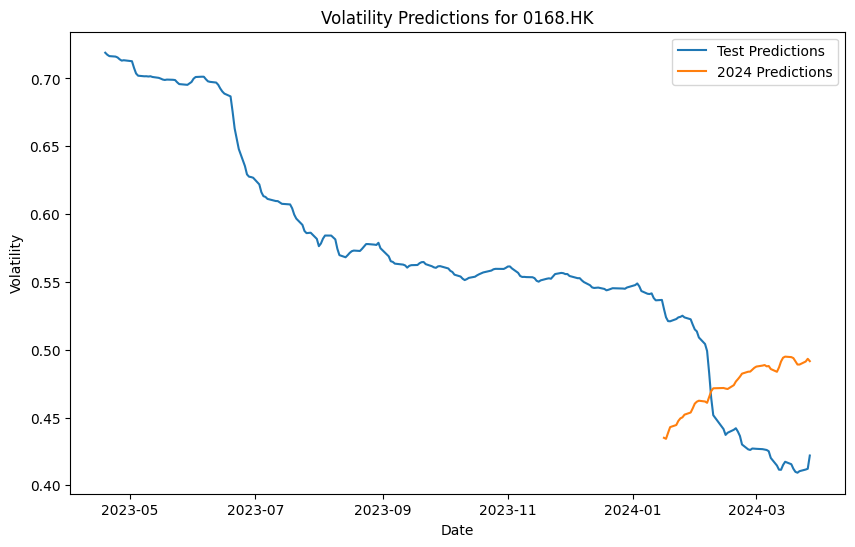

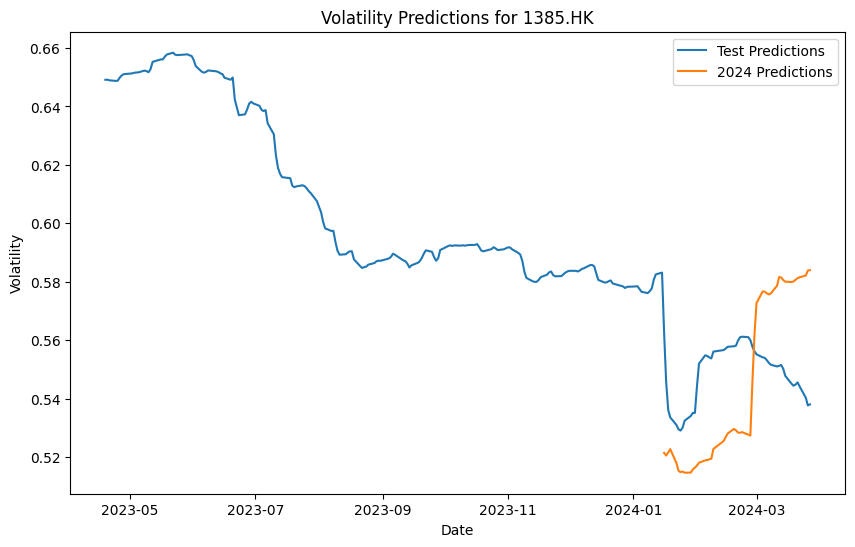

In [ ]:
for ticker in tickers:
    plt.figure(figsize=(10, 6))
    plt.plot(clean_data.index[-len(test_predictions[ticker]):], scaler.inverse_transform(test_predictions[ticker]), label='Test Predictions')
    plt.plot(clean_data.index[-len(predict_predictions[ticker]):], scaler.inverse_transform(predict_predictions[ticker]), label='2024 Predictions')
    plt.title(f'Volatility Predictions for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Volatility')
    plt.legend()
    plt.show()

### Getting the model architecture

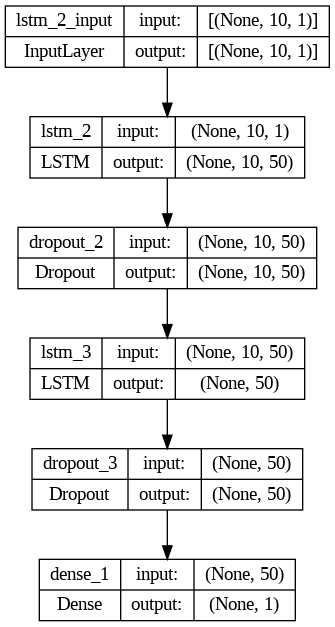

In [ ]:
from tensorflow.keras.utils import plot_model

# Visualize the model
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

### Saving the model

In [ ]:
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
0549483123